In [0]:
!pip install -q pydub

In [0]:
import numpy as np
import imageio
import matplotlib.image as mpimg
from matplotlib import pyplot as plt


shape poster 1 : 4459100
shape poster 2 : (2048, 1384, 3)


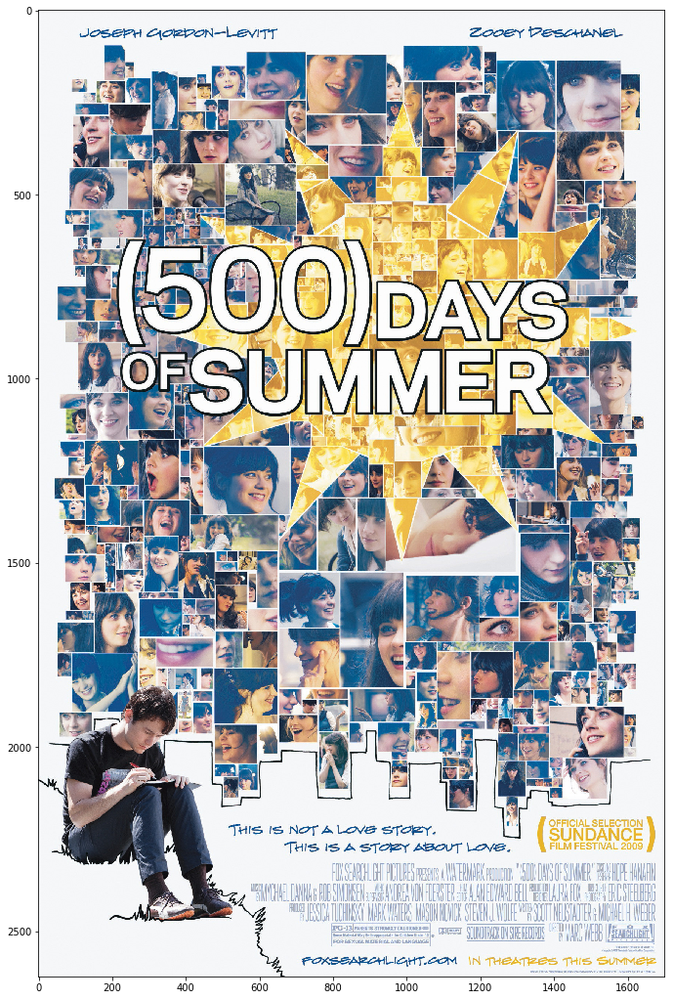

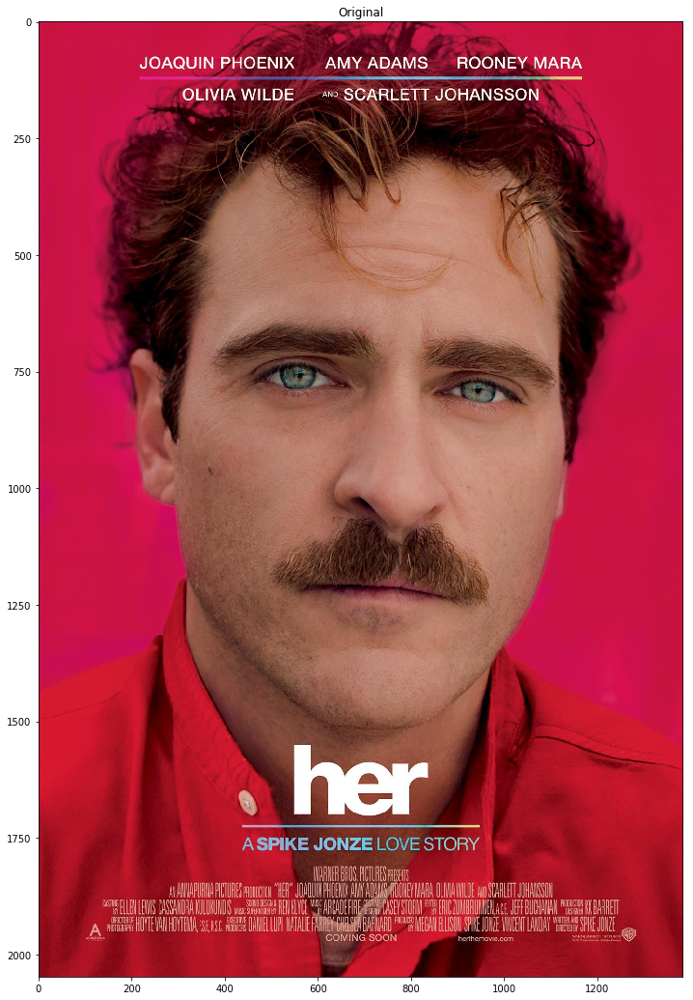

In [0]:
## LEITURA DAS IMAGENS
poster1 = mpimg.imread("five_hundred_days_of_summer_xxlg.jpg")
poster2 = mpimg.imread("her_xxlg.jpg")
poster3 = mpimg.imread("spiderman_far_from_home_ver25_xxlg.jpg")
plt.figure(figsize = (40,40))
plt.subplot(222)
plt.imshow(poster1)


plt.figure(figsize = (40,40))
plt.subplot(223)
plt.imshow(poster2)
plt.title('Original')


print("shape poster 1 :",poster1.shape[0] * poster1.shape[1])
print("shape poster 2 :",poster2.shape)

# New Section

In [0]:
## LEITURA DO AUDIO -- Vamos ter que mudar a música, pq n cabe na imagem
from pydub import AudioSegment
import wave

#conversão, lembrar de mudar o nome dos arquivos
#songmp31 = AudioSegment.from_mp3("The Smiths - There Is A Light That Never Goes Out.mp3")
#songmp31.export("500days.wav", format="wav")

#songmp32 = AudioSegment.from_mp3("Arcade Fire - Song on the Beach; Photograph.mp3")
#songmp32.export("her.wav", format="wav")

songmp31 = AudioSegment.from_mp3("HER (Theodore Memories).mp3")
songmp31.export("her.wav", format="wav")

audio = wave.open("her.wav", mode = None)
#audio1 = wave.open("500days.wav", mode=None)
#audio2 = wave.open("her.wav", mode=None)

#print(1500 * 972)

audioInformation = audio.getparams()
print(audioInformation)
##10-15X mais frames no audio que pixels na imagem // 16-bits for the left channel, 16-bits for the right.

allbytes = audio.readframes(audio.getnframes())
allbytes = bytearray(allbytes)
print(len(allbytes))
#getsampwidth()

#allbytes = extendBytes(allbytes)
print(len(allbytes))


data = open("HER (Theodore Memories).mp3", 'rb').read()
data = extendBytes(data)


_wave_params(nchannels=2, sampwidth=2, framerate=44100, nframes=2083840, comptype='NONE', compname='not compressed')
8335360
8335360
4779012


In [0]:
def normalize(img):
	imax = np.max(img)
	imin = np.min(img)
	img_norm = (img-imin)/(imax-imin)
	img_norm = (img_norm*255).astype(np.uint8)

	return img_norm

In [0]:
# Essa função retorna o próximo valor válido de x (Para andar de dois em dois bits)
def newBitGuardian(x):
  if(x % 10 == 0 ):
    return 2
  else:
    return x+2

In [0]:
def rmse(original, new):
  rmse = []
  error = ((original - new) ** 2)
  error = np.sum(error)
  error *= 1 / (original.shape[0] * original.shape[1])
  error = np.sqrt(error)
  rmse.append(error)
  print(rmse)



In [0]:
##pega o arquivo de audio e separa de 2 em 2 bits (Acaba aumentando o vetor 4 vezes)
def extendBytes(payload):
  newBytes = []
  for i in range (len(payload)):
    for j in range(4): 
      shift = (192 >>(2*j))
      newNumber = payload[i] & shift
      newBytes.append('{0:08b}'.format(newNumber))
  for j in range(4): 
    newBytes.append('{0:08b}'.format(0))
  return newBytes

In [0]:
##most significant bits aproaching
def MSB(image, payload):
  n,m,z = image.shape
  image2d = image.reshape(n*m,z)
  
  output = np.zeros([n*m,z])
  j = 0
  y = 0
  
  x = 2
  #só para termos de comparação o tamanho da imagem e o do audio
  print(n*m,len(payload))
  
  #itera pelo tamanho do audio extendido
  for i in range(len(payload)):
    # para cada valor de i, ver qual será o rgb que ira receber os bits
    if i % 3 == 0:
      #coloca o red na formatação de string para mexer com os bits
      r = '{0:08b}'.format(image2d[j][0])
      # newr = 2bits of payload + 6 least significantes bits of original r
      newR = payload[i][0:2] + r[2:]
      x = newBitGuardian(x)
    if i % 3 == 1:
      g = '{0:08b}'.format(image2d[j][1])
      # newr = 2bits of payload + 6 least significantes bits of original r
      newG = payload[i][0:2] + g[2:]
      x = newBitGuardian(x)
    if i % 3 == 2:
      b = '{0:08b}'.format(image2d[j][2])
      # newr = 2bits of payload + 6 least significantes bits of original r
      newB = payload[i][0:2] + b[2:]
      x = newBitGuardian(x)
      #já que adicionamos bits em todo o valor rgb da imagem, vamos aumentar o j e adicionar o novo valor rgb
      output[j] = [int(newR,2),int(newG,2),int(newB,2)]
      j+=1
  
  print(j)
  for i in range(j,n*m):
    output[i] = image2d[i]
  
  return output.reshape(n,m,z)
    
                

In [0]:
##Função Responsável por executar o lsb
def LSB(image, payload):
  n,m,z = image.shape
  image2d = image.reshape(n*m,z)
  output = np.zeros([n*m,z])
  j = 0
  y = 0
  
  x = 2
  #só para termos de comparação o tamanho da imagem e o do audio
  
  #itera pelo tamanho do audio extendido
  for i in range(len(payload)):
    # para cada valor de i, ver qual será o rgb que ira receber os bits
    if i % 3 == 0:
      #coloca o red na formatação de string para mexer com os bits
      r = '{0:08b}'.format(image2d[j][0])
      # newr = 2bits of payload + 6 least significantes bits of original r
      newR = r[0:6] + payload[i][0:2] 
      x = newBitGuardian(x)
    if i % 3 == 1:
      g = '{0:08b}'.format(image2d[j][1])
      # newr = 2bits of payload + 6 least significantes bits of original r
      newG =  g[0:6] + payload[i][0:2]
      x = newBitGuardian(x)
    if i % 3 == 2:
      b = '{0:08b}'.format(image2d[j][2])
      # newr = 2bits of payload + 6 least significantes bits of original r
      newB =  b[0:6] + payload[i][0:2]
      x = newBitGuardian(x)
      #já que adicionamos bits em todo o valor rgb da imagem, vamos aumentar o j e adicionar o novo valor rgb
      output[j] = [int(newR,2),int(newG,2),int(newB,2)]
      j+=1
  
  for i in range(j,n*m):
    output[i] = image2d[i]
    
  return output.reshape(n,m,z)

In [0]:
poster1MSB = MSB(poster1,data)
poster1LSB = LSB(poster1,data)

poster2MSB = MSB(poster2,data)
poster2LSB = LSB(poster2,data)

poster3MSB = MSB(poster3,data)
poster3LSB = LSB(poster3,data)


poster1MSB = normalize(poster1MSB)
poster1LSB = normalize(poster1LSB)
poster2MSB = normalize(poster2MSB)
poster2LSB = normalize(poster2LSB)
poster3MSB = normalize(poster3MSB)
poster3LSB = normalize(poster3LSB)


4459100 4779012
1593004
1593004
2834432 4779012
1593004
1593004
2826907 4779012
1593004
1593004


Text(0.5, 1.0, 'Poster 3 LSB')

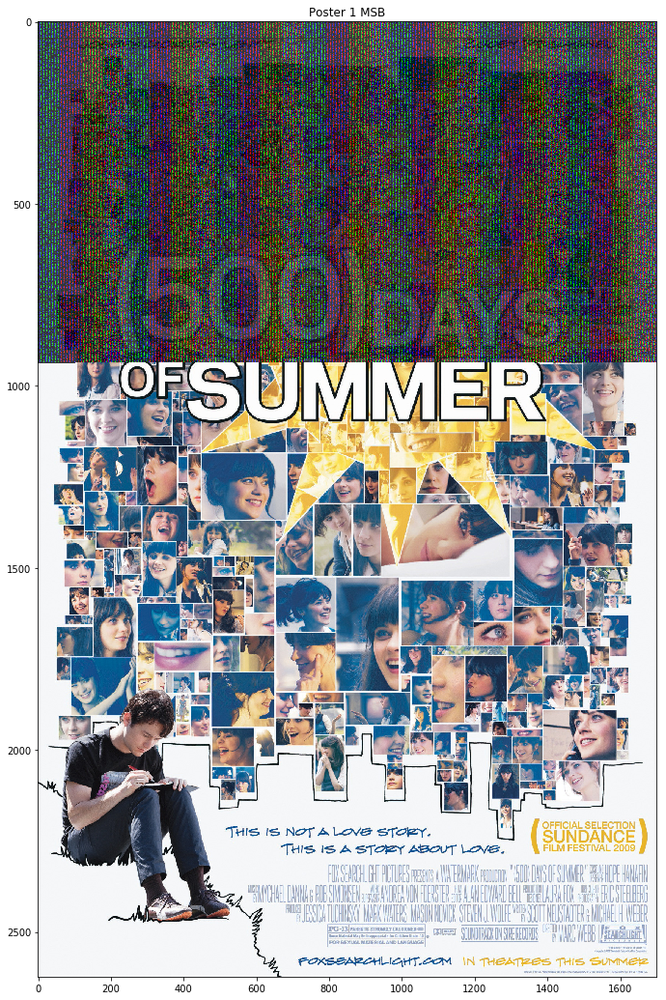

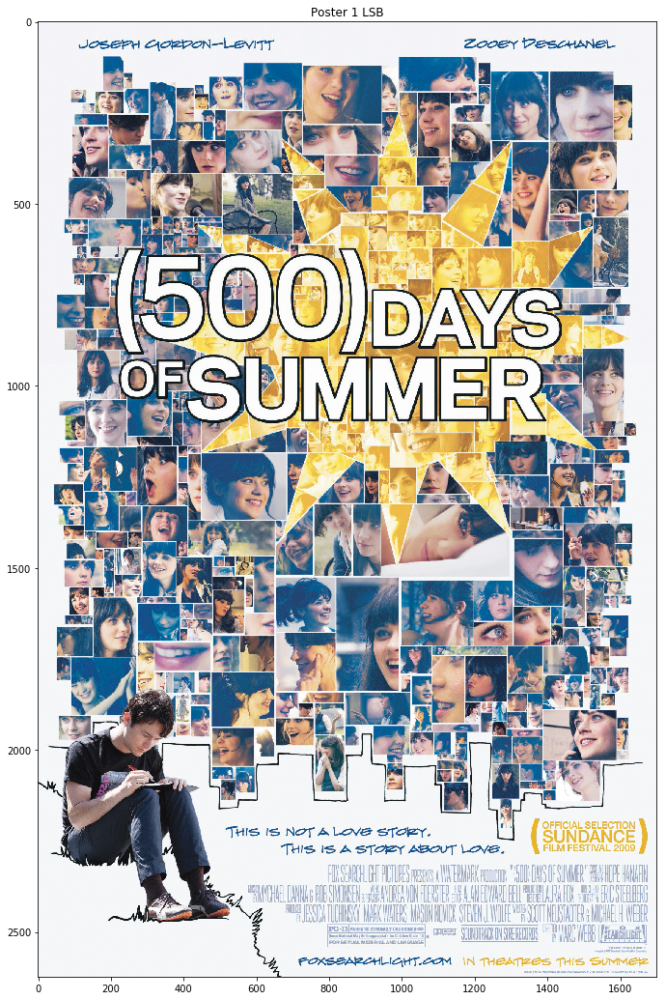

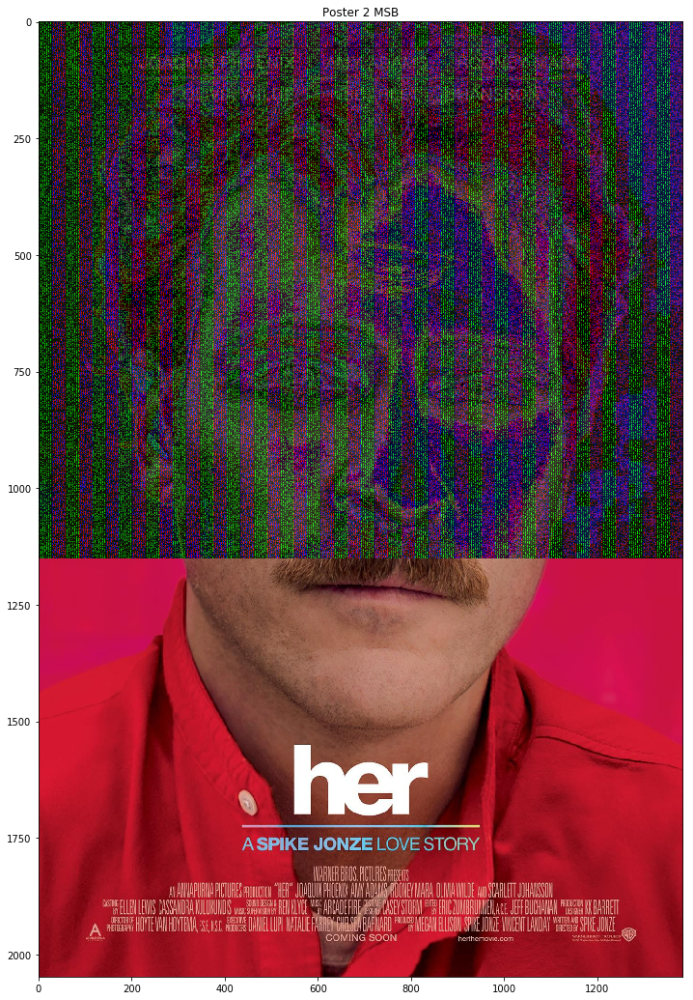

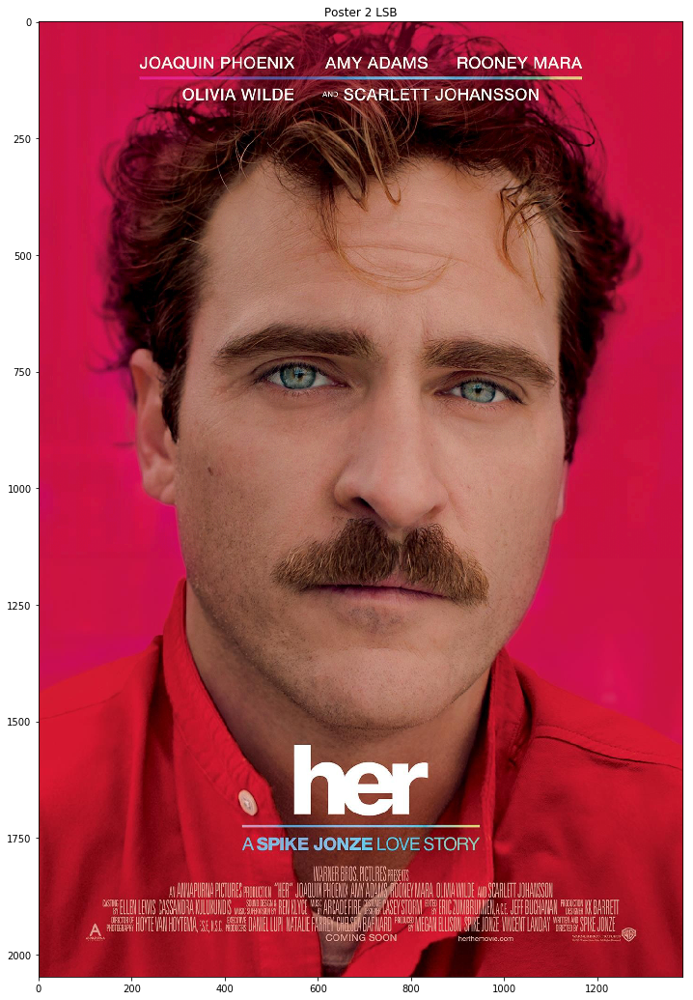

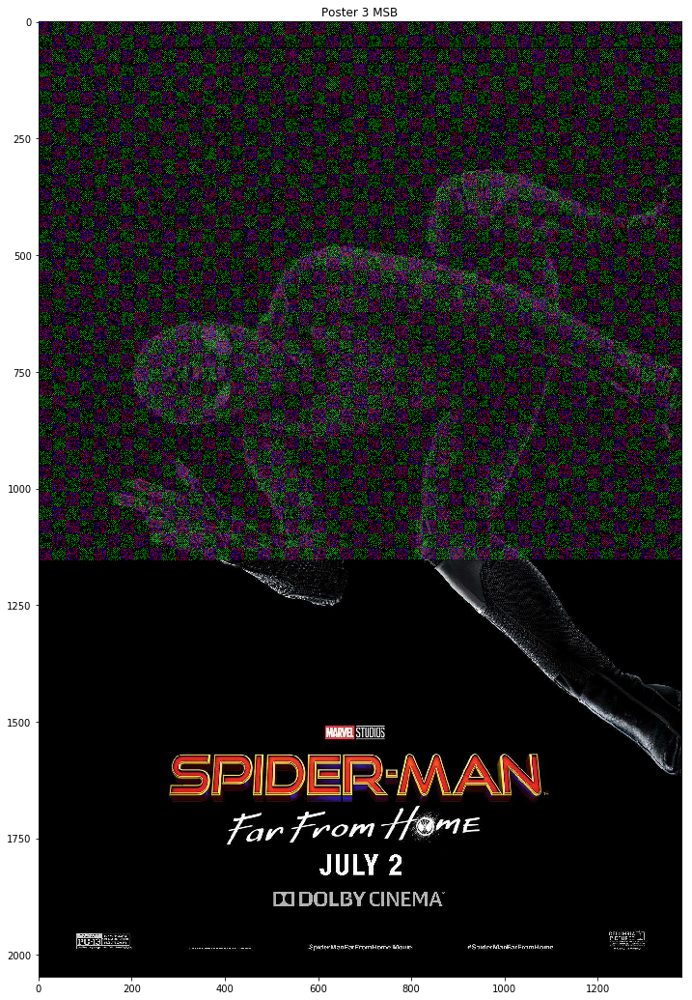

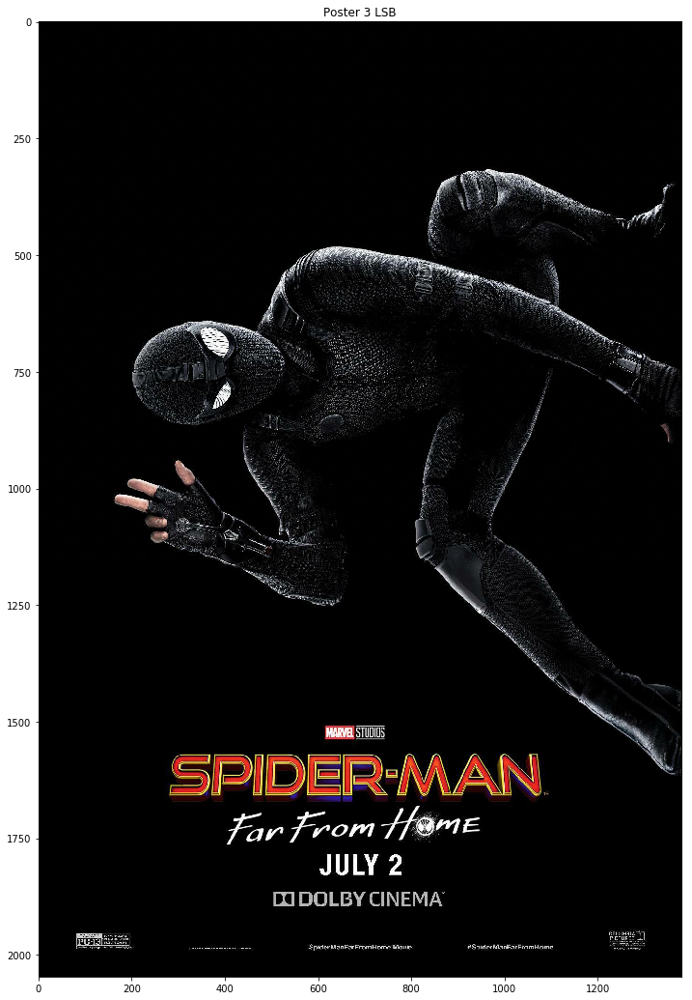

In [0]:

plt.figure(figsize = (40,40))
plt.subplot(222)
plt.imshow(poster1MSB)
plt.title('Poster 1 MSB')


plt.figure(figsize = (40,40))
plt.subplot(222)
plt.imshow(poster1LSB)
plt.title('Poster 1 LSB')


plt.figure(figsize = (40,40))
plt.subplot(222)
plt.imshow(poster2MSB)
plt.title('Poster 2 MSB')


plt.figure(figsize = (40,40))
plt.subplot(222)
plt.imshow(poster2LSB)
plt.title('Poster 2 LSB')


plt.figure(figsize = (40,40))
plt.subplot(222)
plt.imshow(poster3MSB)
plt.title('Poster 3 MSB')


plt.figure(figsize = (40,40))
plt.subplot(222)
plt.imshow(poster3LSB)
plt.title('Poster 3 LSB')

In [0]:
rmse(poster1,poster1MSB)
rmse(poster1,poster1LSB)
rmse(poster2,poster2MSB)
rmse(poster2,poster2LSB)
rmse(poster3,poster3MSB)
rmse(poster3,poster3LSB)





Calculating RMSE --->
[0.0]
Calculating RMSE --->
[1.8450416987633629]
Calculating RMSE --->
[0.0]
Calculating RMSE --->
[2.329393802869265]
Calculating RMSE --->
[0.0]
Calculating RMSE --->
[1.5133074345001896]
